# Introdução

O objetivo deste projeto é explorar técnicas de explicabilidade de forma aplicada a um problema de classificação binária. O contexto é a identificação do tipo de Gliomas (o tipo mais comum de tumores cerebrais): LGG (Lower-Grade Glioma) ou GBM (Glioblastoma Multiforme).

By: Carolina Berrafato

Base de dados: https://archive.ics.uci.edu/dataset/759/glioma+grading+clinical+and+mutation+features+dataset

# Configurações Iniciais

In [ ]:
pip install ucimlrepo

In [ ]:
pip install --upgrade scikit-learn

In [ ]:
pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 2.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=0d927e4621e3877bda6c67c64989bc86d594ab0d4e7731dbc6fd7a8105c37645
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


In [ ]:
# General
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split

# Models
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

# Metrics, xAI and Visualizations
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.tree import plot_tree
from sklearn.inspection import permutation_importance
from sklearn.inspection import PartialDependenceDisplay
from lime import lime_tabular

# Dataset
from ucimlrepo import fetch_ucirepo

# Dataset

In [ ]:
# fetch dataset
glioma_grading_clinical_and_mutation_features = fetch_ucirepo(id=759)

# data (as pandas dataframes)
X = glioma_grading_clinical_and_mutation_features.data.features
y = glioma_grading_clinical_and_mutation_features.data.targets

# metadata
print(glioma_grading_clinical_and_mutation_features.metadata)

# variable information
print(glioma_grading_clinical_and_mutation_features.variables)

{'uci_id': 759, 'name': 'Glioma Grading Clinical and Mutation Features', 'repository_url': 'https://archive.ics.uci.edu/dataset/759/glioma+grading+clinical+and+mutation+features+dataset', 'data_url': 'https://archive.ics.uci.edu/static/public/759/data.csv', 'abstract': 'Gliomas are the most common primary tumors of the brain. They can be graded as LGG (Lower-Grade Glioma) or GBM (Glioblastoma Multiforme) depending on the histological/imaging criteria. Clinical and molecular/mutation factors are also very crucial for the grading process. Molecular tests are expensive to help accurately diagnose glioma patients.    In this dataset, the most frequently mutated 20 genes and 3 clinical features are considered from TCGA-LGG and TCGA-GBM brain glioma projects.  The prediction task is to determine whether a patient is LGG or GBM with a given clinical and molecular/mutation features. The main objective is to find the optimal subset of mutation genes and clinical features for the glioma grading 

In [ ]:
X.head()

,Gender,Age_at_diagnosis,Race,IDH1,TP53,ATRX,PTEN,EGFR,CIC,MUC16,...,FUBP1,RB1,NOTCH1,BCOR,CSMD3,SMARCA4,GRIN2A,IDH2,FAT4,PDGFRA
0,0,51.30,white,1,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
1,0,38.72,white,1,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
2,0,35.17,white,1,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,32.78,white,1,1,1,0,0,0,1,...,0,0,0,0,0,0,0,0,1,0
4,0,31.51,white,1,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
X.describe()

,Gender,Age_at_diagnosis,IDH1,TP53,ATRX,PTEN,EGFR,CIC,MUC16,PIK3CA,...,FUBP1,RB1,NOTCH1,BCOR,CSMD3,SMARCA4,GRIN2A,IDH2,FAT4,PDGFRA
count,839.000000,839.000000,839.000000,839.000000,839.000000,839.000000,839.000000,839.000000,839.000000,839.000000,...,839.000000,839.000000,839.000000,839.000000,839.000000,839.000000,839.000000,839.000000,839.000000,839.000000
mean,0.418355,50.935411,0.481526,0.414779,0.258641,0.168057,0.133492,0.132300,0.116806,0.087008,...,0.053635,0.047676,0.045292,0.034565,0.032181,0.032181,0.032181,0.027414,0.027414,0.026222
std,0.493583,15.702339,0.499957,0.492978,0.438149,0.374140,0.340309,0.339019,0.321380,0.282015,...,0.225431,0.213206,0.208068,0.182784,0.176586,0.176586,0.176586,0.163383,0.163383,0.159889
min,0.000000,14.420000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,38.055000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,51.550000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,62.800000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,89.290000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


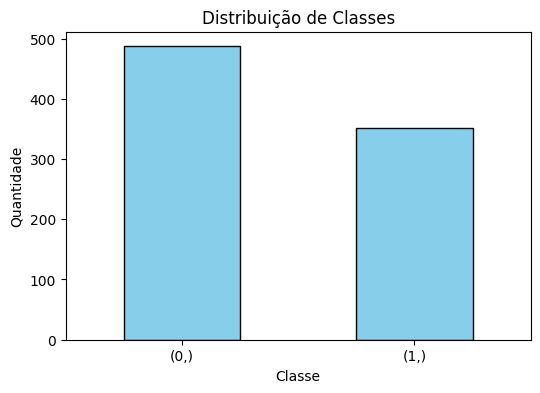

In [ ]:
class_count = y.value_counts()

plt.figure(figsize=(6,4))
class_count.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title("Distribuição de Classes")
plt.xlabel("Classe")
plt.ylabel("Quantidade")
plt.xticks(rotation=0)
plt.show()

In [ ]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 839 entries, 0 to 838
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Gender            839 non-null    int64  
 1   Age_at_diagnosis  839 non-null    float64
 2   Race              839 non-null    object 
 3   IDH1              839 non-null    int64  
 4   TP53              839 non-null    int64  
 5   ATRX              839 non-null    int64  
 6   PTEN              839 non-null    int64  
 7   EGFR              839 non-null    int64  
 8   CIC               839 non-null    int64  
 9   MUC16             839 non-null    int64  
 10  PIK3CA            839 non-null    int64  
 11  NF1               839 non-null    int64  
 12  PIK3R1            839 non-null    int64  
 13  FUBP1             839 non-null    int64  
 14  RB1               839 non-null    int64  
 15  NOTCH1            839 non-null    int64  
 16  BCOR              839 non-null    int64  
 1

## Pré-processamento

In [ ]:
print(X["Race"].unique())

['white' 'asian' 'black or african american'
 'american indian or alaska native']


In [ ]:
X.loc[X["Race"] == "white", "Race"] = 0
X.loc[X["Race"] == "black or african american", "Race"] = 1
X.loc[X["Race"] == "asian", "Race"] = 2
X.loc[X["Race"] == "american indian or alaska native", "Race"] = 3

In [ ]:
print(X["Race"].unique())

[0 2 1 3]


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Modelos

## Decision Tree

In [ ]:
dt = DecisionTreeClassifier(max_depth=5, min_samples_leaf=2)

dt.fit(X_train, y_train)
y_pred_dt = dt.predict(X_test)

print("Decision Tree Report:\n", classification_report(y_test, y_pred_dt))

Decision Tree Report:
               precision    recall  f1-score   support

           0       0.91      0.80      0.85        89
           1       0.80      0.91      0.85        79

    accuracy                           0.85       168
   macro avg       0.86      0.85      0.85       168
weighted avg       0.86      0.85      0.85       168



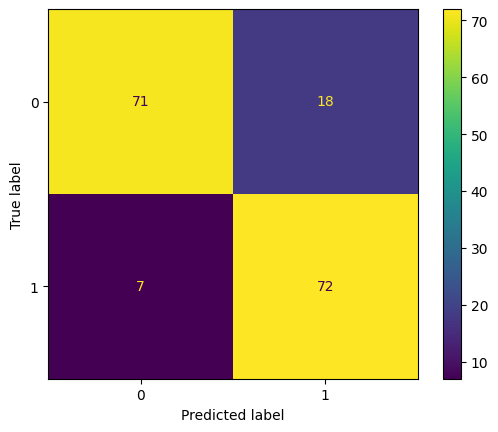

In [ ]:
# Matriz de Confusão
cm = confusion_matrix(y_test, y_pred_dt, labels=dt.classes_)

disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=dt.classes_)

disp.plot()
plt.show()

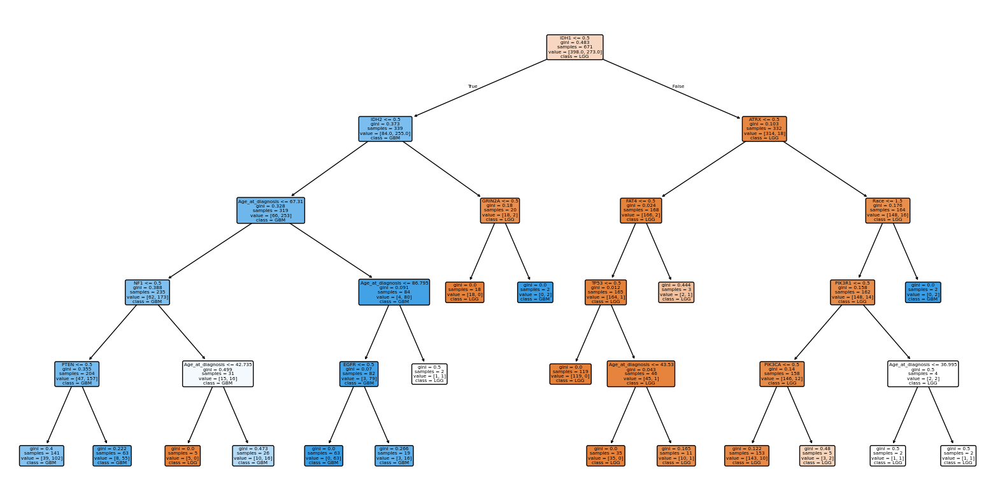

In [ ]:
plt.figure(figsize=(20,10))
plot_tree(dt, feature_names=X_train.columns, class_names=['LGG','GBM'], filled=True, rounded=True)
plt.show()

### Análise da Árvore de Decisão

A cobertura e a confiança calculadas sobre um nó de uma árvore de decisão são informações extremamente úteis para descobrir as regras de tomada de decisão do modelo, sendo calculadas da seguinte forma:

- Cobertura = Total de amostras no nó / Total de amostras na raiz
- Confiança = Amostras da classe prevista / Total de amostras no nó

Partindo dessa ideia, podemos calcular que o primeiro nó da subárvore direita, classificado como LGG, possui 332/671 = 49,5% de **cobertura** e 314/332 = 94,6% de **confiança**.

Esses números mostram que quando o valor de ATRX2 <= 0.5 (isto é, quando não há mutação no remodelador de cromatina ATRX2) e IDH1 > 0.5 (quando há mutação no isocitrate dehydrogenase, que é a condição no nó raiz da árvore), o modelo classifica o glioma como LGG com 94,6% de confiança. Essa regra demonstra como a combinação entre a não-mutação em ATRX2 e a mutação em IDH1 pode ser decisiva na classificação do glioma para um alto número de casos, se aplicando a 49,5% dos pacientes.

Aprofundando a análise e repetindo os cálculos dessas métricas para o 1° nó terminal da subárvore direita, temos que a cobertura é 119/671 = 17,8% e a confiança: 119/119 = 100%. Embora a cobertura seja sobre pouco menos que 1/5 das instâncias, a confiança máxima demonstra como a mutação em IDH1 (valores > 0.5) e a não mutação (valores <= 0.5) em ATRX2, FAT4 e TP53 combinada é um forte indicativo de classificação do glioma como LGG. "Subindo" esse nó em dois níveis, isto é, fazendo com que a regra combine apenas IDH1 > 0.5 e ATRX2 e FAT4 (valores <= 0.5) nos leva a uma cobertura maior: 168/671 = 25%, e uma confiança quase tão alta quanto a máxima na classificação de LGG: 166/168 = 98,8%.

Por outro lado, as regras definidas nessa árvore possuem um pouco mais de dificuldade na classificação do GBM - nenhuma teve um grau de confiança e cobertura tão altos (de forma combinada) quando comparado ao LGG. A melhor regra identificada para esse tipo de glioma combinou IDH1 e IDH2 com mutação (valores <= 0.5), e uma idade maior que 86.795 anos, atingindo 84/671 = 12,5% de cobertura, e 80/84 = 95,2% de confiança.

É interessante observar que a regra do nó pai a esse previamente analisado também considera a idade para a classificação, mas utiliza o valor 67.31 como ponto de corte. Embora a confiança seja menor (253/319 = 79,3%), a cobertura é bem maior (319/671 = 47,5%).

## Random Forest

In [ ]:
rf = RandomForestClassifier(n_estimators=20, max_depth=10)

rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_test)

print("Random Forest Report:\n", classification_report(y_test, y_pred_rf))

Random Forest Report:
               precision    recall  f1-score   support

           0       0.88      0.81      0.84        89
           1       0.80      0.87      0.84        79

    accuracy                           0.84       168
   macro avg       0.84      0.84      0.84       168
weighted avg       0.84      0.84      0.84       168



/usr/local/lib/python3.11/dist-packages/sklearn/base.py:1365: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


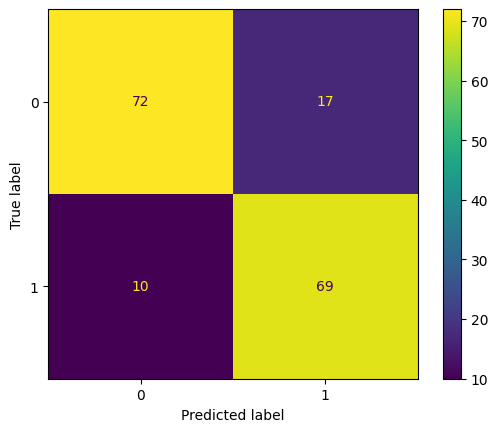

In [ ]:
# Matriz de Confusão
cm = confusion_matrix(y_test, y_pred_rf, labels=rf.classes_)

disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=rf.classes_)

disp.plot()
plt.show()

## Logistic Regression

In [ ]:
lr = LogisticRegression(max_iter=1000, random_state=42)

lr.fit(X_train, y_train)
y_pred_lr = lr.predict(X_test)

print("Logistic Regression Report:\n", classification_report(y_test, y_pred_lr))

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1406: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Logistic Regression Report:
               precision    recall  f1-score   support

           0       0.92      0.82      0.87        89
           1       0.82      0.92      0.87        79

    accuracy                           0.87       168
   macro avg       0.87      0.87      0.87       168
weighted avg       0.88      0.87      0.87       168



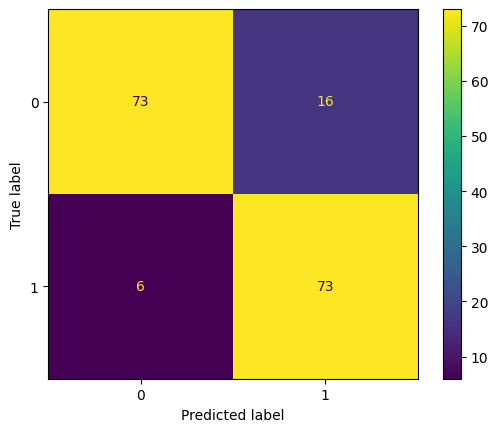

In [ ]:
# Matriz de Confusão
cm = confusion_matrix(y_test, y_pred_lr, labels=lr.classes_)

disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=lr.classes_)

disp.plot()
plt.show()

## kNN

In [ ]:
knn = KNeighborsClassifier(n_neighbors=10)

knn.fit(X_train, y_train)
y_pred_knn = knn.predict(X_test)

print("kNN Report:\n", classification_report(y_test, y_pred_knn))

kNN Report:
               precision    recall  f1-score   support

           0       0.83      0.79      0.81        89
           1       0.77      0.82      0.80        79

    accuracy                           0.80       168
   macro avg       0.80      0.80      0.80       168
weighted avg       0.81      0.80      0.80       168



/usr/local/lib/python3.11/dist-packages/sklearn/neighbors/_classification.py:239: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


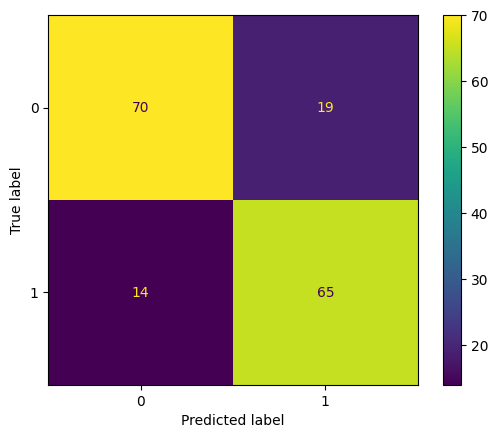

In [ ]:
# Matriz de Confusão
cm = confusion_matrix(y_test, y_pred_knn, labels=knn.classes_)

disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=knn.classes_)

disp.plot()
plt.show()

## SVC

In [ ]:
svc = KNeighborsClassifier(n_neighbors=10)

svc.fit(X_train, y_train)
y_pred_svc = svc.predict(X_test)

print("SVC Report:\n", classification_report(y_test, y_pred_svc))

SVC Report:
               precision    recall  f1-score   support

           0       0.83      0.79      0.81        89
           1       0.77      0.82      0.80        79

    accuracy                           0.80       168
   macro avg       0.80      0.80      0.80       168
weighted avg       0.81      0.80      0.80       168



/usr/local/lib/python3.11/dist-packages/sklearn/neighbors/_classification.py:239: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


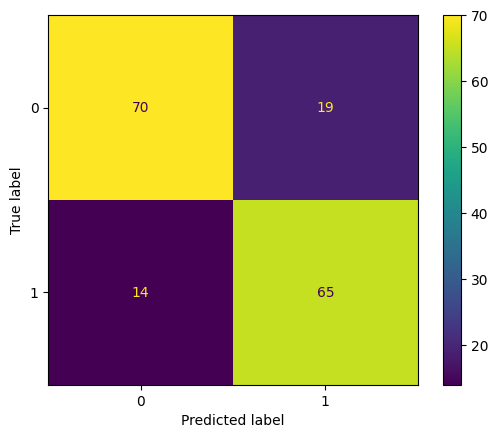

In [ ]:
# Matriz de Confusão
cm = confusion_matrix(y_test, y_pred_svc, labels=svc.classes_)

disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=svc.classes_)

disp.plot()
plt.show()

Escolhi o F1-score como métrica principal para esse problema de classificação, visto que além da classificação correta do tipo de tumor ser crucial para a eficácia do tratamento e erros poderem direcionar a uma intervenção incorreta, testes moleculares são caros (como apresentado na própria descrição do dataset) - fazendo com que o equilíbrio entre precision e recall seja ainda mais importante.

De todos os algoritmos testados, a regressão logística foi o que apresentou os melhores resultados - não apenas em termos de F1-score, mas também em relação às outras métricas. Por isso, foi ele o selecionado para aplicação das técnicas de interpretabilidade. Ainda assim, a árvore de decisão teve uma performance muito parecida e por isso fiz uma comparação entre os dois modelos, tomando como base a análise de cobertura e confiança previamente realizada.

# xAI

## Feature Importances

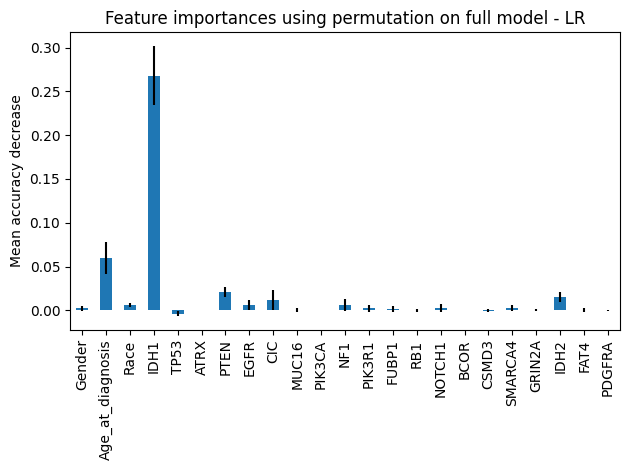

In [ ]:
# PFI para a Regressão Logística

result = permutation_importance(lr, X_test, y_test, n_repeats=100, random_state=2)
forest_importances = pd.Series(result.importances_mean, index=X.columns)

fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=result.importances_std, ax=ax)
ax.set_title("Feature importances using permutation on full model - LR")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

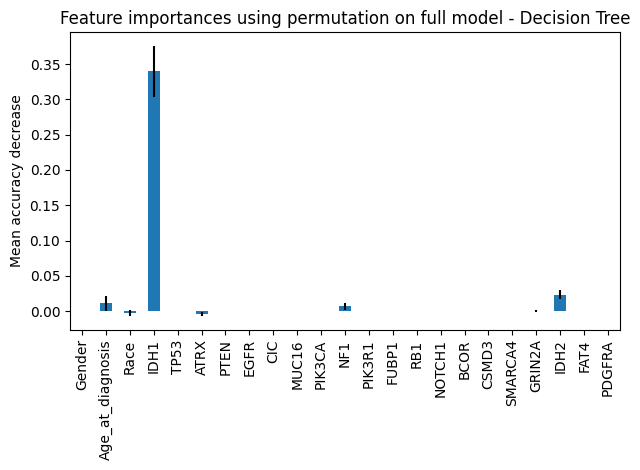

In [ ]:
# PFI para a Árvore de Decisão previamente analisada

result = permutation_importance(dt, X_test, y_test, n_repeats=100, random_state=2)
forest_importances = pd.Series(result.importances_mean, index=X.columns)

fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=result.importances_std, ax=ax)
ax.set_title("Feature importances using permutation on full model - Decision Tree")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

### Discussão

Como podemos observar a partir dos plots acima, a presença ou não de mutação em IDH1 é considerada a variável mais importante para a classificação do tipo de glioma por ambos os algoritmos de Regressão Logística e Árvore de Decisão.

Na RL a idade do diagnóstico é a segunda variável mais importante para a tomada de decisão, em oposição à DT, que considera mais importante a presença ou não de mutação em IDH2.

É interessante fazer essa comparação porque, embora ambos os modelos tenham tido uma performance muito parecida, a DT deu muito mais importância a IDH1, enquanto a RL distribuiu melhor a importância entre outras variáveis (embora IDH1 seja, de longe, a mais significativa para ambos os modelos).

## Global Surrogate

Dado que a Regressão Logística já é um modelo considerado interpretável, vamos fazer esse experimento para o Random Forest previamente treinado, utilizando uma árvore de decisão para ele como global surrogate.

In [ ]:
# Lembrando o RF previamente treinado:

# rf = RandomForestClassifier(n_estimators=20, max_depth=10)
# rf.fit(X_train, y_train)

# Aplicando novamente o predict do RF, mas dessa vez sobre o X_train em vez de X_test
rf_surr_pred = rf.predict(X_train)

In [ ]:
# Global surrogate

dt_surrogate = DecisionTreeClassifier(max_depth=5, min_samples_leaf=2)

dt_surrogate.fit(X_train, rf_surr_pred)
y_pred_dt_surr = dt_surrogate.predict(X_train)

print("Decision Tree Surrogate Report:\n", classification_report(rf_surr_pred, y_pred_dt_surr))

Decision Tree Surrogate Report:
               precision    recall  f1-score   support

           0       0.97      0.97      0.97       365
           1       0.96      0.96      0.96       306

    accuracy                           0.97       671
   macro avg       0.97      0.97      0.97       671
weighted avg       0.97      0.97      0.97       671



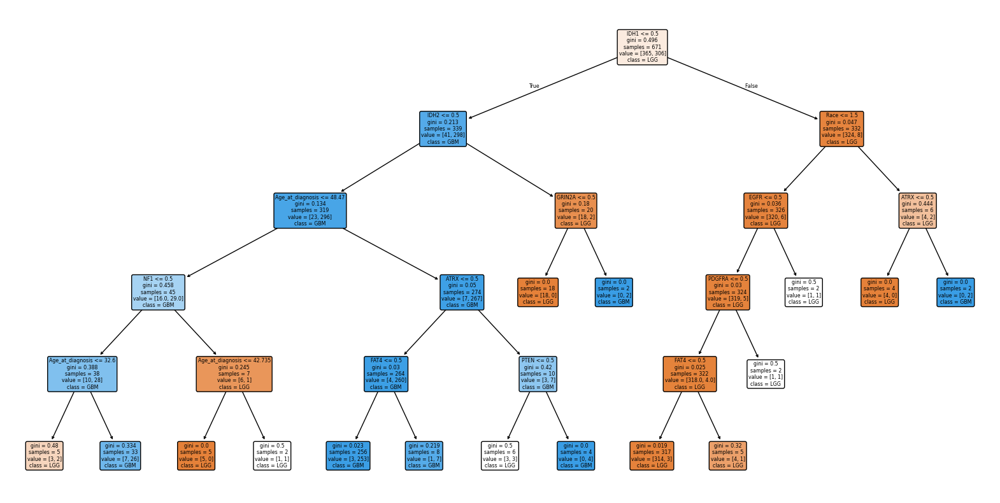

In [ ]:
plt.figure(figsize=(20,10))
plot_tree(dt_surrogate, feature_names=X_train.columns, class_names=['LGG','GBM'], filled=True, rounded=True)
plt.show()

### Discussão

Podemos perceber que no caso do Random Forest simulado pela árvore de decisão, a presença ou não de mutação em IDH1 ainda é o fator decisivo na regra inicial (raiz). Quando há mutação (> 0.5), a próxima regra considera se há também mutação em IDH2. Do contrário, a próxima variável considerada é a PIK3R1.

Duas regras bastante úteis indicadas pelo global surrogate, com base em confiança e cobertura, são:

- IDH1 > 0.5 e PIK3R1 <= 0.5 levam à classe LGG
  - Cobertura: 332/671 = 49,5%
  - Confiança: 326/332 = 98,2%

- IDH1 <= 0.5, IDH2 <= 0.5, Age_at_diagnosis > 0.5, ATRX <= 0.5 levam à classe GBM
  - Cobertura: 274/671 = 40,8%
  - Confiança: 266/274 = 97,1%

## PDP

Decidimos plotar os PDPs para as variáveis consideradas mais importantes (extraídas do plot de feature importances para a Regressão Logística)

/usr/local/lib/python3.11/dist-packages/sklearn/inspection/_partial_dependence.py:717: FutureWarning: The column 3 contains integer data. Partial dependence plots are not supported for integer data: this can lead to implicit rounding with NumPy arrays or even errors with newer pandas versions. Please convert numerical featuresto floating point dtypes ahead of time to avoid problems. This will raise ValueError in scikit-learn 1.9.
  warnings.warn(


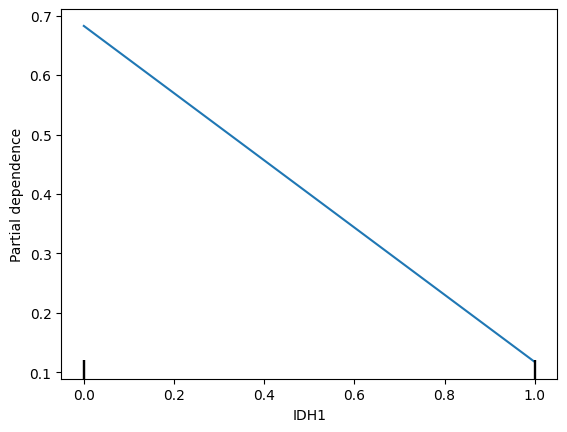

In [ ]:
# Uni-dimensional
disp1 = PartialDependenceDisplay.from_estimator(lr, X_test, ['IDH1'], grid_resolution=20, response_method='predict_proba', target=1, kind='average')

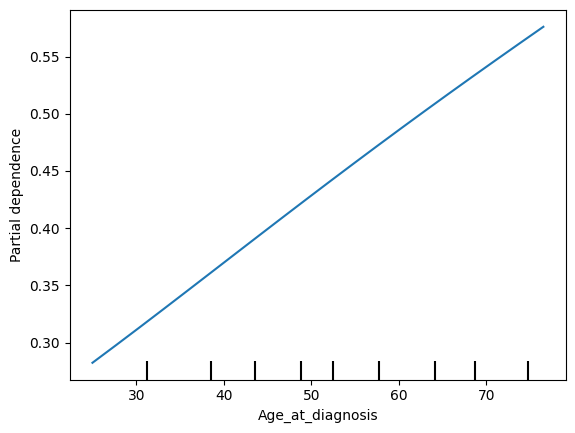

In [ ]:
# Uni-dimensional
disp2 = PartialDependenceDisplay.from_estimator(lr, X_test, ['Age_at_diagnosis'], grid_resolution=20, response_method='predict_proba', target=1, kind='average')

/usr/local/lib/python3.11/dist-packages/sklearn/inspection/_partial_dependence.py:717: FutureWarning: The column 3 contains integer data. Partial dependence plots are not supported for integer data: this can lead to implicit rounding with NumPy arrays or even errors with newer pandas versions. Please convert numerical featuresto floating point dtypes ahead of time to avoid problems. This will raise ValueError in scikit-learn 1.9.
  warnings.warn(


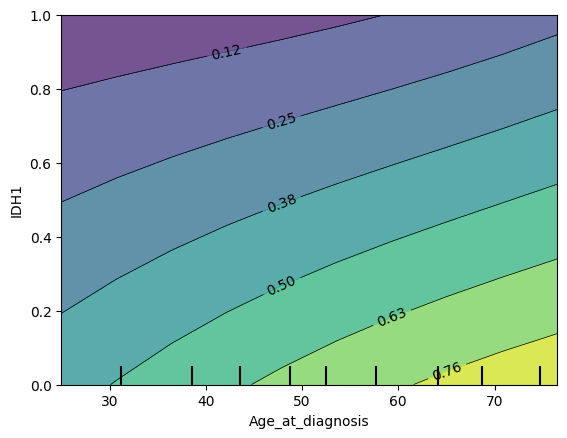

In [ ]:
disp1 = PartialDependenceDisplay.from_estimator(lr, X_test, [(1,3)],grid_resolution=10)

### Discussão

O primeiro PDP unidimensional demonstra que valores mais baixos para IDH1 (ou seja, 0, já que é uma variável binária), aumentam as chances de predição para a classe positiva. Isso significa que quando não há mutação em IDH1, o modelo tem uma tendência maior a classificar a instância como GBM. Enquanto isso, valores mais altos para IDH1 (ou seja, 1) aumentam as chances de predição para a classe negativa - ou seja quando não há mutação em IDH1, o modelo tende a classificar o tumor como LGG.

Já o segundo PDP unidimensional indica que, quanto maior a idade do paciente no período de diagnóstico, maiores as chances de predição para a classe positiva (GBM). Pacientes mais jovens que possuem gliomas têm uma tendência maior de terem um LGG em vez de um GBM.

Por fim, o PDP bidimensional que correlaciona essas duas variáveis nos mostra que idades mais altas e uma não mutação em IDH1 tendem a levar à classificação do glioma como GBM, considerando a região do gráfico em amarelo-limão. Mas a idade só tem relevância mais significativa para a predição da classe positiva quando IDH1 é 0, demonstrando que IDH1 é a feature mais importante dentre essas duas (como comprovado pelo plot de feature importances). Isso porque quando IDH1 é 1, independentemente da variação da idade, a região do topo do gráfico é predominantemente roxa.

## Local Surrogate

In [ ]:
explainer_lime = lime_tabular.LimeTabularExplainer(X_train.values, feature_names= X_train.columns, class_names= ["LGG","GBM"], mode='classification')

In [ ]:
# Instancia escolhida para explicar
index = 5

# Verificando as informações da instância
print(X_test.iloc[index,:])
print(y_test.iloc[index])

Gender                  1
Age_at_diagnosis    56.02
Race                    0
IDH1                    0
TP53                    0
ATRX                    0
PTEN                    0
EGFR                    0
CIC                     0
MUC16                   0
PIK3CA                  0
NF1                     0
PIK3R1                  0
FUBP1                   0
RB1                     0
NOTCH1                  0
BCOR                    0
CSMD3                   0
SMARCA4                 0
GRIN2A                  0
IDH2                    0
FAT4                    0
PDGFRA                  0
Name: 731, dtype: object
Grade    1
Name: 731, dtype: int64


In [ ]:
exp = explainer_lime.explain_instance(X_test.iloc[index].values, lr.predict_proba)
exp.show_in_notebook(show_table=True)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


In [ ]:
# Instancia escolhida para explicar
index = 3

# Verificando as informações da instância
print(X_test.iloc[index,:])
print(y_test.iloc[index])

Gender                  0
Age_at_diagnosis    61.17
Race                    0
IDH1                    1
TP53                    1
ATRX                    1
PTEN                    0
EGFR                    0
CIC                     0
MUC16                   1
PIK3CA                  0
NF1                     0
PIK3R1                  0
FUBP1                   0
RB1                     0
NOTCH1                  0
BCOR                    0
CSMD3                   0
SMARCA4                 0
GRIN2A                  0
IDH2                    0
FAT4                    0
PDGFRA                  0
Name: 67, dtype: object
Grade    0
Name: 67, dtype: int64


In [ ]:
exp = explainer_lime.explain_instance(X_test.iloc[index].values, lr.predict_proba)
exp.show_in_notebook(show_table=True)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


### Discussão

Ambas as explicações geradas com o LIME demonstram que a feature IDH1 foi a que mais contribuiu para a decisão, independentemente do tipo de glioma. A primeira instância, da classe positiva (GBM), foi principalmente influenciada pelas variáveis IDH1, NOTCH1 e IDH2, nessa ordem. Todas as 3 variáveis aumentaram a probabilidade de classificação em GBM.

Já a segunda instância, da classe negativa (LGG), foi principalmente influenciada pelas variáveis IDH1, IDH2 e NOTCH1, nessa ordem, mas apenas a primeira aumentou a probabilidade de classificação em LGG. Isso pode ser um indicativo de que os valores de IDH2 e NOTCH1 - que são 0 para ambas as instâncias nas quais aplicamos o LIME - tendem a pender a classificação do tumor para GBM quando não possuem mutações.

O X_test possui apenas 3 instâncias com NOTCH1 == 1, mas plotamos o LIME para as três (ver próximas células) - e em todas elas, o NOTCH1 contribuiu para o aumento na probabilidade de a instância ser classificada como LGG.

Também existem apenas 3 instâncias com IDH2 == 1 no X_test, mas aconteceu o mesmo: a presença de mutação em IDH2 (valor == 1) contribui para o aumento na probabilidade de a instância ser classificada como LGG. O código está nas próximas células.

#### NOTCH1 == 1

In [ ]:
# O iloc busca no dataframe por posição númerica, e não exatamente por índice. Então vamos encontrar primeiro os índices e depois suas respectivas posições numéricas

mask = X_test['NOTCH1'] == 1
indices = X_test.index[mask]

print(indices)

Index([137, 54, 168], dtype='int64')


In [ ]:
numeric_positions = []

for value in indices:
  row_position = X_test.index.get_loc(value)
  numeric_positions.append(row_position)

print(numeric_positions)

[42, 106, 136]


In [ ]:
# Instancia escolhida para explicar
index = 42

# Verificando as informações da instância
print(X_test.iloc[index,:])
print(y_test.iloc[index])

Gender                  1
Age_at_diagnosis    36.52
Race                    0
IDH1                    1
TP53                    0
ATRX                    0
PTEN                    0
EGFR                    0
CIC                     0
MUC16                   0
PIK3CA                  0
NF1                     0
PIK3R1                  0
FUBP1                   0
RB1                     0
NOTCH1                  1
BCOR                    0
CSMD3                   0
SMARCA4                 0
GRIN2A                  0
IDH2                    0
FAT4                    0
PDGFRA                  0
Name: 137, dtype: object
Grade    0
Name: 137, dtype: int64


In [ ]:
exp = explainer_lime.explain_instance(X_test.iloc[index].values, lr.predict_proba)
exp.show_in_notebook(show_table=True)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


In [ ]:
# Instancia escolhida para explicar
index = 106

# Verificando as informações da instância
print(X_test.iloc[index,:])
print(y_test.iloc[index])

Gender                  1
Age_at_diagnosis    57.55
Race                    0
IDH1                    1
TP53                    0
ATRX                    0
PTEN                    0
EGFR                    0
CIC                     1
MUC16                   0
PIK3CA                  1
NF1                     0
PIK3R1                  0
FUBP1                   0
RB1                     0
NOTCH1                  1
BCOR                    0
CSMD3                   0
SMARCA4                 1
GRIN2A                  0
IDH2                    0
FAT4                    0
PDGFRA                  0
Name: 54, dtype: object
Grade    0
Name: 54, dtype: int64


In [ ]:
exp = explainer_lime.explain_instance(X_test.iloc[index].values, lr.predict_proba)
exp.show_in_notebook(show_table=True)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


In [ ]:
# Instancia escolhida para explicar
index = 136

# Verificando as informações da instância
print(X_test.iloc[index,:])
print(y_test.iloc[index])

Gender                  0
Age_at_diagnosis    39.17
Race                    0
IDH1                    1
TP53                    0
ATRX                    0
PTEN                    0
EGFR                    0
CIC                     0
MUC16                   0
PIK3CA                  1
NF1                     0
PIK3R1                  1
FUBP1                   1
RB1                     0
NOTCH1                  1
BCOR                    0
CSMD3                   0
SMARCA4                 0
GRIN2A                  0
IDH2                    0
FAT4                    0
PDGFRA                  0
Name: 168, dtype: object
Grade    0
Name: 168, dtype: int64


In [ ]:
exp = explainer_lime.explain_instance(X_test.iloc[index].values, lr.predict_proba)
exp.show_in_notebook(show_table=True)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


#### IDH2 == 1

In [ ]:
# O iloc busca no dataframe por posição númerica, e não exatamente por índice. Então vamos encontrar primeiro os índices e depois suas respectivas posições numéricas

mask = X_test['IDH2'] == 1
indices = X_test.index[mask]

print(indices)

Index([447, 110, 29], dtype='int64')


In [ ]:
numeric_positions = []

for value in indices:
  row_position = X_test.index.get_loc(value)
  numeric_positions.append(row_position)

print(numeric_positions)

[66, 124, 133]


In [ ]:
# Instancia escolhida para explicar
index = 66

# Verificando as informações da instância
print(X_test.iloc[index,:])
print(y_test.iloc[index])

Gender                  1
Age_at_diagnosis    28.58
Race                    0
IDH1                    0
TP53                    0
ATRX                    0
PTEN                    0
EGFR                    0
CIC                     1
MUC16                   0
PIK3CA                  0
NF1                     0
PIK3R1                  0
FUBP1                   0
RB1                     0
NOTCH1                  0
BCOR                    0
CSMD3                   0
SMARCA4                 0
GRIN2A                  0
IDH2                    1
FAT4                    0
PDGFRA                  0
Name: 447, dtype: object
Grade    0
Name: 447, dtype: int64


In [ ]:
exp = explainer_lime.explain_instance(X_test.iloc[index].values, lr.predict_proba)
exp.show_in_notebook(show_table=True)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


In [ ]:
# Instancia escolhida para explicar
index = 124

# Verificando as informações da instância
print(X_test.iloc[index,:])
print(y_test.iloc[index])

Gender                  1
Age_at_diagnosis    49.76
Race                    1
IDH1                    0
TP53                    0
ATRX                    0
PTEN                    0
EGFR                    0
CIC                     0
MUC16                   0
PIK3CA                  0
NF1                     0
PIK3R1                  0
FUBP1                   0
RB1                     0
NOTCH1                  0
BCOR                    0
CSMD3                   0
SMARCA4                 0
GRIN2A                  0
IDH2                    1
FAT4                    0
PDGFRA                  0
Name: 110, dtype: object
Grade    0
Name: 110, dtype: int64


In [ ]:
exp = explainer_lime.explain_instance(X_test.iloc[index].values, lr.predict_proba)
exp.show_in_notebook(show_table=True)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


In [ ]:
# Instancia escolhida para explicar
index = 133

# Verificando as informações da instância
print(X_test.iloc[index,:])
print(y_test.iloc[index])

Gender                  0
Age_at_diagnosis    32.21
Race                    0
IDH1                    0
TP53                    1
ATRX                    1
PTEN                    0
EGFR                    0
CIC                     0
MUC16                   1
PIK3CA                  0
NF1                     0
PIK3R1                  0
FUBP1                   0
RB1                     0
NOTCH1                  0
BCOR                    0
CSMD3                   0
SMARCA4                 0
GRIN2A                  0
IDH2                    1
FAT4                    0
PDGFRA                  0
Name: 29, dtype: object
Grade    0
Name: 29, dtype: int64


In [ ]:
exp = explainer_lime.explain_instance(X_test.iloc[index].values, lr.predict_proba)
exp.show_in_notebook(show_table=True)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


## Conclusões Gerais

- A feature mais importante é IDH1: a presença ou não de mutações em IDH1 é um forte indicativo sobre o tipo de glioma. Quando há mutação (IDH1 > 0.5) a classificação do tumor geralmente é LGG. Do contrário, geralmente é GBM.
- Outras features podem variar em termos de contribuição para a classificação a depender do modelo, mas IDH1 é a mais significativa em todos os que foram verificados - seu valor geralmente impacta na contribuição das outras variáveis, como pôde ser observado no PDP bi-dimensional entre Age_at_diagnosis e IDH1.
- A idade do paciente na época do diagnóstico ("Age_at_diagnosis"), IDH2 e NOTCH1 podem ter contribuições consideráveis na decisão a depender da instância e modelo.